<a href="https://colab.research.google.com/github/JonathanSor/PHYS486-S22/blob/main/ProjectOne/Project_One_Code_WIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [114]:
#@title Import Packages
# Import packages we will use often.
import numpy as np
import math

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'png')
plt.rcParams['savefig.dpi'] = 200

plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = 10, 6
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['font.size'] = 16
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 8
plt.rcParams['legend.fontsize'] = 14

In [115]:
#@title Input Variables
#Input Variables:
#Baseline Initial Values for the Projectiles:
v_0 = 100                           #Initial velocity[m/s]
theta_0 = math.pi/360               #Launch angle [radians] (0 degrees)
vx_0 = v_0*math.cos(theta_0)        #Initial x velocity [m/s]
vy_0 = v_0*math.sin(theta_0)        #Initial y velocity [m/s]
x_0 = 0                             #Initial x position [m]
y_0 = 100                           #Initial height [m]
C = 0.001                           #Parameter representing the drag coefficient multiplied by the cross sectional area [m^2]
m = 0.1                             #Mass of the object [kg]

#Time:
t_0 = 0                             #Initial time [s]
t_step = 0.001                      #The time between each iteration [s]

#Dropped Projectile Velocities:     #Initial velocities for the dropped projectile [m/s]                    
vd_x_0 = 0
vd_y_0 = 0

#Constants:
p = 1.225                           #Density of air [kg/m^3]
g = 9.81                            #Acceleration due to gravity [m/s^2]

In [116]:
#@title Function 1: Updating Velocities
#Function 1: This function updates the velocity components for the next point in time using the Euler method.
def update_velocities(vx_now, vy_now, C, p, g, m, t_step):
  v_now = math.sqrt(vx_now*vx_now + vy_now*vy_now)                               #This combines the old component velocities to find the net
                                                                                 #velocity, which is needed in addition to the components.
  vx_next = vx_now - C*p*v_now*vx_now*t_step/(2*m)                               #These two lines calculate the new velocities using Euler
  vy_next = vy_now - g*t_step - C*p*v_now*vy_now*t_step/(2*m)                    #method definitions.

  return vx_next, vy_next

In [117]:
#@title Function 2: Updating Positions
#Function 2: This function updates the positions for the next point in time using the Euler method.
def update_positions(x_now, y_now, vx_now, vy_now, t_step):
  x_next = x_now + vx_now*t_step                                                 #These two lines calculate the new positions using Euler
  y_next = y_now + vy_now*t_step                                                 #method definitions.

  return x_next, y_next

In [118]:
#@title Function 3: Iterating Positions
#Function 3: This function iterates the positions and velocities for the projectile until it lands using a while loop.
def output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m):
  x_positions = []                                                               #This part creates the x and y positions arrays, and gives them
  x_positions.append(x_0)                                                        #each their first entry.
  y_positions = []
  y_positions.append(y_0)
  
  vx_next, vy_next = update_velocities(vx_0, vy_0, C, p, g, m, t_step)           #This defines the values for the positions, velocities, and
  x_next, y_next = update_positions(x_0, y_0, vx_0, vy_0, t_step)                #time for the initial (i = 0) iteration of the while loop.
  t = t_0 + t_step
  i = 0                                         

  while y_positions[i] >= 0:                                                     #This creates a while loop using the previously defined functions.
    x_positions.append(x_next)                                                   #These two lines state the variables that will be stored in each array.
    y_positions.append(y_next)
    vx_now = vx_next                                                             #These two lines define the current "old" velocity to be the value of
    vy_now = vy_next                                                             #the previous "new" one. 
    vx_next, vy_next = update_velocities(vx_now, vy_now, C, p, g, m, t_step)     #These two lines use functions 1 and 2 to update the velocities and positions
    x_next, y_next = update_positions(x_next, y_next, vx_next, vy_next, t_step)  #for the current iteration, to be stored in the arrays.
    t += t_step                                                                  #This line updates the time.
    i += 1                                                                       #This line updates i, the iteration number, telling the loop to start again
                                                                                 #of the condition isn't met.
  return x_positions, y_positions, i


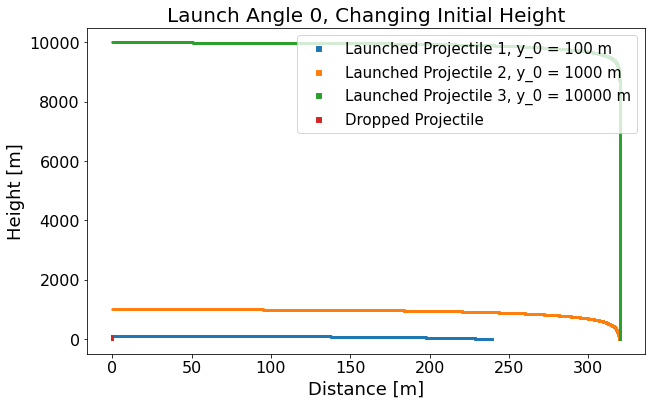

A positive time difference means the launched projectile took that much more time to land than the dorpped projectile.
A negative time difference means the launched projectile toot that much less time to land than the dropped projectile.
Landing Time Difference 1 =  0.7380000000000004  seconds
Landing Time Difference 2 =  23.862000000000002  seconds
Landing Time Difference 3 =  248.747  seconds


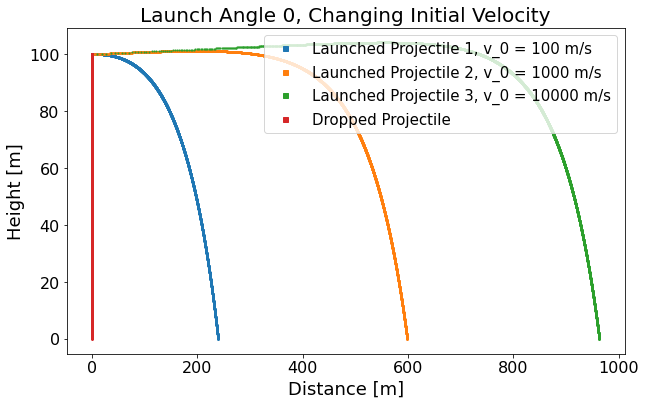

Landing Time Difference 1 =  0.7380000000000004  seconds
Landing Time Difference 2 =  1.5229999999999997  seconds
Landing Time Difference 3 =  1.7560000000000002  seconds


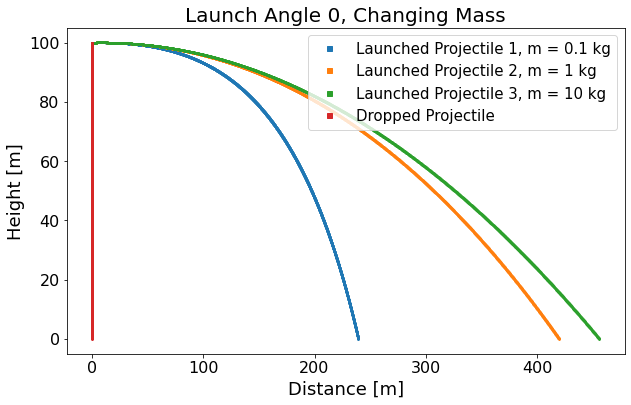

Landing Time Difference 1 =  0.7380000000000004  seconds
Landing Time Difference 2 =  -0.18599999999999994  seconds
Landing Time Difference 3 =  -0.36099999999999977  seconds


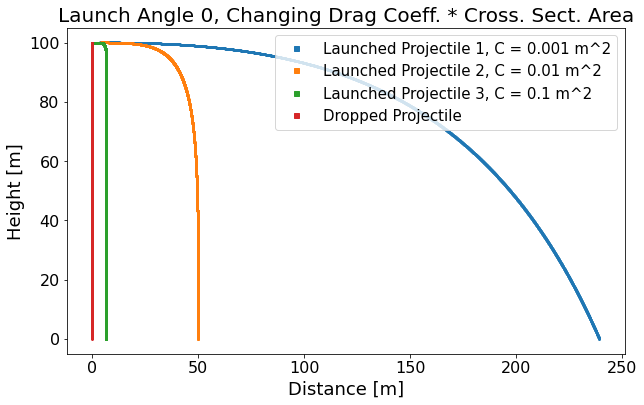

Landing Time Difference 1 =  0.7380000000000004  seconds
Landing Time Difference 2 =  4.3149999999999995  seconds
Landing Time Difference 3 =  20.471000000000004  seconds


In [119]:
#@title Plot Group 1: Launch Angle = 0 
#Angle = 0
#This and the following three cells each use Function 3 to output the positions of the projectiles. Each cell is concerned with a different launch angle.
#Each cell creates four plots. Each plot changes one different initial condition across three orders of magnitude, and compares the landing-time to that
#of the dropped projectile.



#Changing Initial Height:
y_02 = y_0*10                                                                                         #Defines the initial height of the second and third launched projectiles.
y_03 = y_0*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)               #Calls Function 3 with the baseline initial conditions inputted.
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i                                      #Redefines the outputs of Function 3 so they can be identified as for
                                                                                                      #launched projectile 1.
x_positions, y_positions, i = output_positions(x_0, y_02, vx_0, vy_0, t_0, t_step, C, m)              #The same as before, but inputting a new value for the initial height.
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i                                      #Again redfines the outputs as for launched projectile 2. The next few
                                                                                                      #lines do the same for launched projectile 3 and the dropped projectile.
x_positions, y_positions, i = output_positions(x_0, y_03, vx_0, vy_0, t_0, t_step, C, m)              
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 0, Changing Initial Height')                                                  #This segment creates a plot. The first line tells it to have a title.
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, y_0 = 100 m')        #These four lines plot the positon values of the four projectiles, and
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, y_0 = 1000 m')       #tells the plot to have labels for them in a legend.
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, y_0 = 10000 m')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)                                               #This defines the parameters of the legend.
plt.xlabel('Distance [m]')                                                                            #These two lines create x and y axis labels.
plt.ylabel('Height [m]')
plt.show()                                                                                            #This line plots the plot.


landing_time_l1 = i_l1*t_step                                                                         #This segment is concerned with displaying the landing time differences.
landing_time_l2 = i_l2*t_step                                                                         #These first four lines define the different landing times using the 
landing_time_l3 = i_l3*t_step                                                                         #final number ofiteratiosn for each projectile and the time step.
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d                                                  #These three lines compute the difference in landing time between each
time_difference_2 = landing_time_l2 - landing_time_d                                                  #launched projectile and the dropped projectile.
time_difference_3 = landing_time_l3 - landing_time_d
print("A positive time difference means the launched projectile took that much more time to land than the dorpped projectile.")   #Prints what positive and negative time
print("A negative time difference means the launched projectile toot that much less time to land than the dropped projectile.")   #differences indicate.
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                  #These three lines print the three time differences.                          
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Initial Velocity:                                                                           #This segement, and the next two segments of this cell, do the exact same as
v_02 = v_0*10                                                                                         #the previous segment, but for three other different parameters, which are
vx_02 = v_02*math.cos(theta_0)                                                                        #labelled.
vy_02 = v_02*math.sin(theta_0)                                                                        #The only new thing to note here is there are a few extra lines here to break
                                                                                                      #new initial velocities into new x and y components.
v_03 = v_0*100
vx_03 = v_03*math.cos(theta_0)
vy_03 = v_03*math.sin(theta_0)



x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_02, vy_02, t_0, t_step, C, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_03, vy_03, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i



plt.title('Launch Angle 0, Changing Initial Velocity')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, v_0 = 100 m/s')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, v_0 = 1000 m/s')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, v_0 = 10000 m/s')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()



landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Mass:
m_2 = m*10
m_3 = m*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_2) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_3)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 0, Changing Mass')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, m = 0.1 kg')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, m = 1 kg')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, m = 10 kg')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing C:
C_2 = C*10
C_3 = C*100


x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_2, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_3, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 0, Changing Drag Coeff. * Cross. Sect. Area')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, C = 0.001 m^2')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, C = 0.01 m^2')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, C = 0.1 m^2')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 

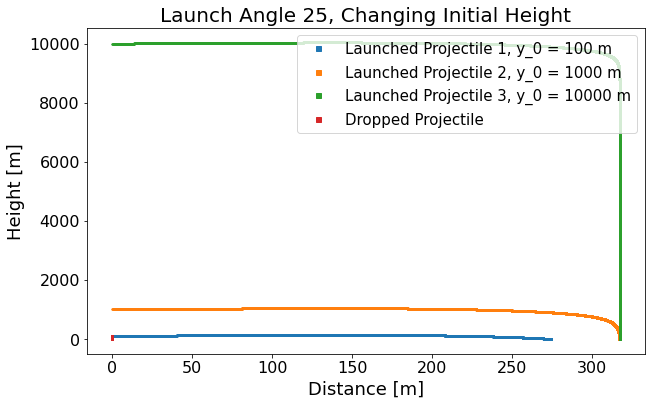

Landing Time Difference 1 =  3.994999999999999  seconds
Landing Time Difference 2 =  26.777  seconds
Landing Time Difference 3 =  251.662  seconds


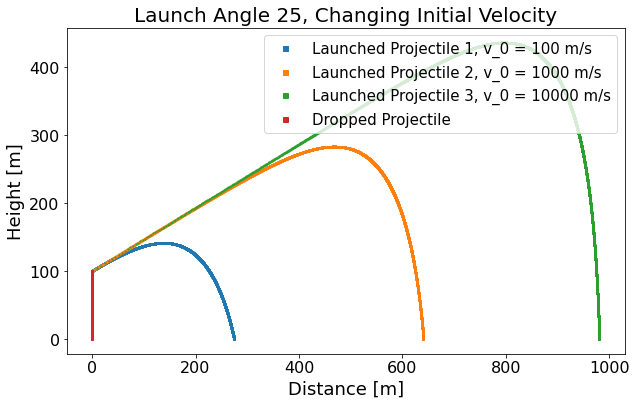

Landing Time Difference 1 =  3.994999999999999  seconds
Landing Time Difference 2 =  8.962  seconds
Landing Time Difference 3 =  12.976  seconds


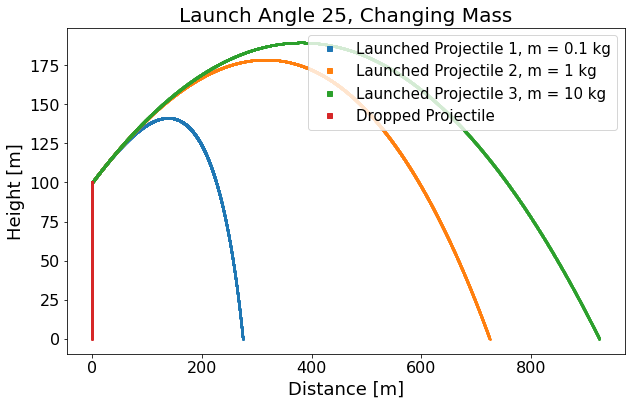

Landing Time Difference 1 =  3.994999999999999  seconds
Landing Time Difference 2 =  5.195  seconds
Landing Time Difference 3 =  5.521000000000001  seconds


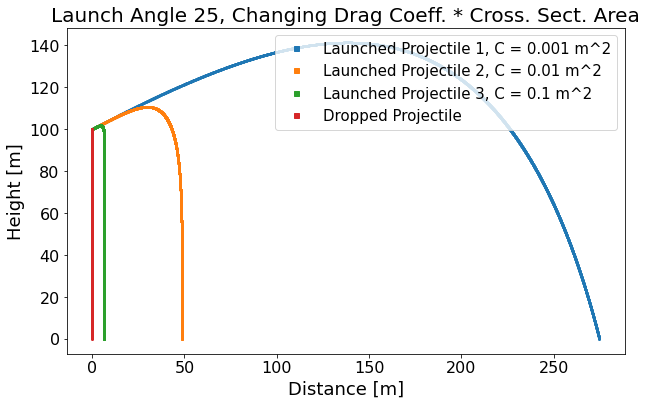

Landing Time Difference 1 =  3.994999999999999  seconds
Landing Time Difference 2 =  5.843  seconds
Landing Time Difference 3 =  21.136000000000003  seconds


In [120]:
#@title Plot Group 2: Launch Angle = 25
#Angle = 25
#This and the next two cells are each identical to the previous cell, except with different launch angles. 


#New Launch Angle:
v_0 = 100                                                                                               #These lines here define new values for the launch angle and the                                        
theta_0 = math.pi/7.2                                                                                   #resulting new velocities.
vx_0 = v_0*math.cos(theta_0)                                                                            #Everything in the remainder of this cell and the next two cells
vy_0 = v_0*math.sin(theta_0)                                                                            #is identical to the previous cell. As such, this is the final comment
                                                                                                        #describing the function fo the different lines of code.


#Changing Initial Height:
y_02 = y_0*10
y_03 = y_0*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_02, vx_0, vy_0, t_0, t_step, C, m) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_03, vx_0, vy_0, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 25, Changing Initial Height')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, y_0 = 100 m')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, y_0 = 1000 m')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, y_0 = 10000 m')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Initial Velocity:
v_02 = v_0*10
vx_02 = v_02*math.cos(theta_0)
vy_02 = v_02*math.sin(theta_0)

v_03 = v_0*100
vx_03 = v_03*math.cos(theta_0)
vy_03 = v_03*math.sin(theta_0)



x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_02, vy_02, t_0, t_step, C, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_03, vy_03, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i



plt.title('Launch Angle 25, Changing Initial Velocity')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, v_0 = 100 m/s')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, v_0 = 1000 m/s')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, v_0 = 10000 m/s')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()



landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Mass:
m_2 = m*10
m_3 = m*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_2) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_3)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 25, Changing Mass')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, m = 0.1 kg')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, m = 1 kg')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, m = 10 kg')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing C:
C_2 = C*10
C_3 = C*100


x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_2, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_3, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 25, Changing Drag Coeff. * Cross. Sect. Area')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, C = 0.001 m^2')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, C = 0.01 m^2')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, C = 0.1 m^2')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 

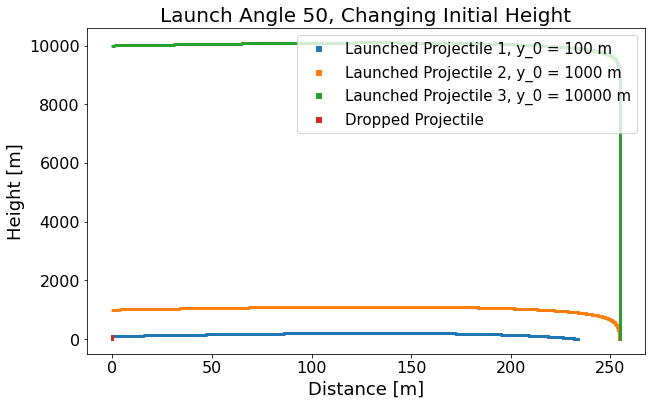

Landing Time Difference 1 =  6.922000000000001  seconds
Landing Time Difference 2 =  29.525  seconds
Landing Time Difference 3 =  254.41  seconds


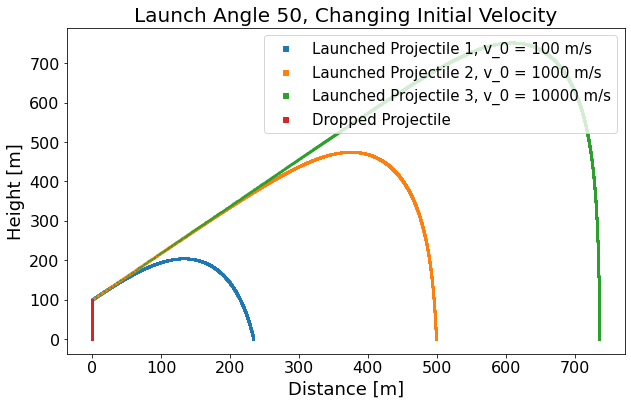

Landing Time Difference 1 =  6.922000000000001  seconds
Landing Time Difference 2 =  15.092  seconds
Landing Time Difference 3 =  22.18  seconds


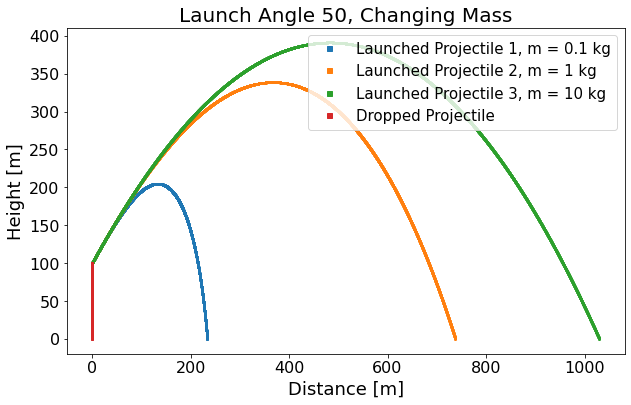

Landing Time Difference 1 =  6.922000000000001  seconds
Landing Time Difference 2 =  10.425  seconds
Landing Time Difference 3 =  11.664  seconds


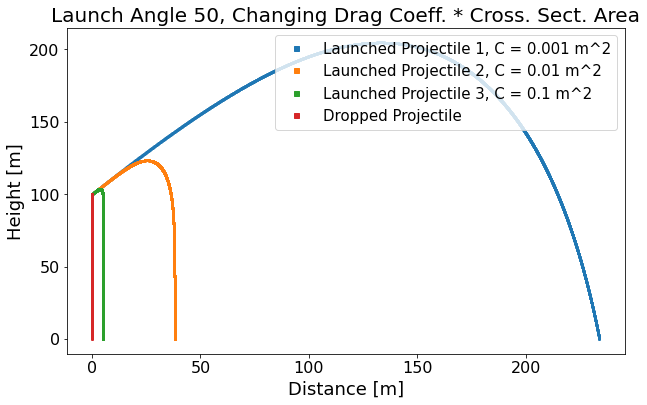

Landing Time Difference 1 =  6.922000000000001  seconds
Landing Time Difference 2 =  7.246  seconds
Landing Time Difference 3 =  21.732  seconds


In [121]:
#@title Plot Group 3: Launch Angle = 50
#Angle = 50

#New Launch Angle:
v_0 = 100                                                                                                                                    
theta_0 = math.pi/3.6                                                                              
vx_0 = v_0*math.cos(theta_0)                                                                         
vy_0 = v_0*math.sin(theta_0)                                                                          
                                                                                                   


#Changing Initial Height:
y_02 = y_0*10
y_03 = y_0*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_02, vx_0, vy_0, t_0, t_step, C, m) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_03, vx_0, vy_0, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 50, Changing Initial Height')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, y_0 = 100 m')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, y_0 = 1000 m')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, y_0 = 10000 m')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Initial Velocity:
v_02 = v_0*10
vx_02 = v_02*math.cos(theta_0)
vy_02 = v_02*math.sin(theta_0)

v_03 = v_0*100
vx_03 = v_03*math.cos(theta_0)
vy_03 = v_03*math.sin(theta_0)



x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_02, vy_02, t_0, t_step, C, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_03, vy_03, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i



plt.title('Launch Angle 50, Changing Initial Velocity')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, v_0 = 100 m/s')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, v_0 = 1000 m/s')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, v_0 = 10000 m/s')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()



landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Mass:
m_2 = m*10
m_3 = m*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_2) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_3)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 50, Changing Mass')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, m = 0.1 kg')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, m = 1 kg')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, m = 10 kg')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing C:
C_2 = C*10
C_3 = C*100


x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_2, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_3, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 50, Changing Drag Coeff. * Cross. Sect. Area')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, C = 0.001 m^2')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, C = 0.01 m^2')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, C = 0.1 m^2')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 

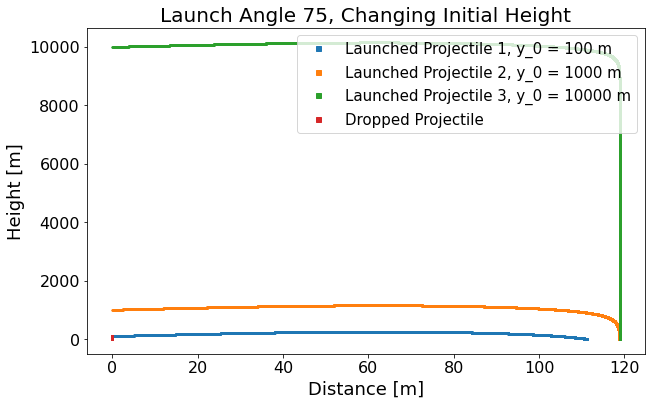

Landing Time Difference 1 =  8.834  seconds
Landing Time Difference 2 =  31.374000000000002  seconds
Landing Time Difference 3 =  256.26  seconds


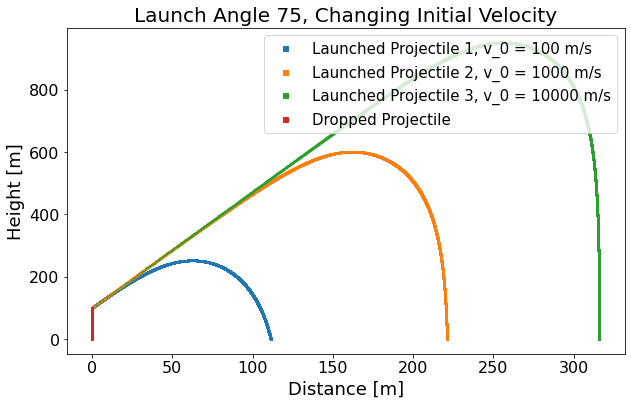

Landing Time Difference 1 =  8.834  seconds
Landing Time Difference 2 =  18.975  seconds
Landing Time Difference 3 =  27.875999999999998  seconds


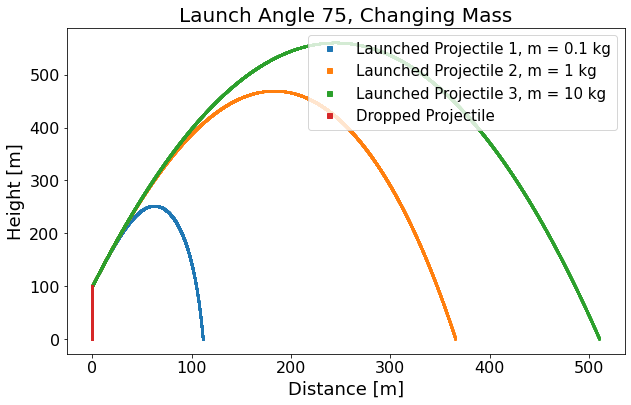

Landing Time Difference 1 =  8.834  seconds
Landing Time Difference 2 =  13.639999999999999  seconds
Landing Time Difference 3 =  15.424999999999999  seconds


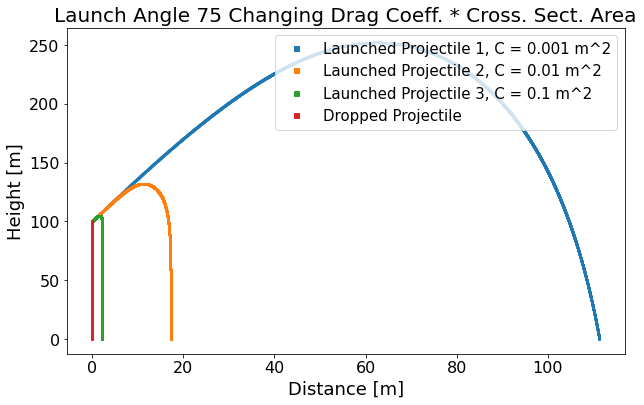

Landing Time Difference 1 =  8.834  seconds
Landing Time Difference 2 =  8.168000000000001  seconds
Landing Time Difference 3 =  22.113  seconds


In [122]:
#@title Plot Group 4: Launch Angle = 75
#Angle = 75

#New Launch Angle:
v_0 = 100                                                                                                                                    
theta_0 = math.pi/2.4                                                                         
vx_0 = v_0*math.cos(theta_0)                                                                         
vy_0 = v_0*math.sin(theta_0)                                                                          
                                                                                                   


#Changing Initial Height:
y_02 = y_0*10
y_03 = y_0*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_02, vx_0, vy_0, t_0, t_step, C, m) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_03, vx_0, vy_0, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 75, Changing Initial Height')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, y_0 = 100 m')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, y_0 = 1000 m')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, y_0 = 10000 m')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Initial Velocity:
v_02 = v_0*10
vx_02 = v_02*math.cos(theta_0)
vy_02 = v_02*math.sin(theta_0)

v_03 = v_0*100
vx_03 = v_03*math.cos(theta_0)
vy_03 = v_03*math.sin(theta_0)



x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_02, vy_02, t_0, t_step, C, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_03, vy_03, t_0, t_step, C, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i



plt.title('Launch Angle 75, Changing Initial Velocity')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, v_0 = 100 m/s')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, v_0 = 1000 m/s')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, v_0 = 10000 m/s')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()



landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing Mass:
m_2 = m*10
m_3 = m*100

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_2) 
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m_3)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 75, Changing Mass')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, m = 0.1 kg')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, m = 1 kg')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, m = 10 kg')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 





#Changing C:
C_2 = C*10
C_3 = C*100


x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C, m)
xl1_positions, yl1_positions, i_l1 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_2, m)             
xl2_positions, yl2_positions, i_l2 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vx_0, vy_0, t_0, t_step, C_3, m)             
xl3_positions, yl3_positions, i_l3 = x_positions, y_positions, i

x_positions, y_positions, i = output_positions(x_0, y_0, vd_x_0, vd_y_0, t_0, t_step, C, m)
xd_positions, yd_positions, i_d = x_positions, y_positions, i


plt.title('Launch Angle 75 Changing Drag Coeff. * Cross. Sect. Area')
plt.plot(xl1_positions, yl1_positions,'s', ms=1, label = 'Launched Projectile 1, C = 0.001 m^2')
plt.plot(xl2_positions, yl2_positions,'s', ms=1, label = 'Launched Projectile 2, C = 0.01 m^2')  
plt.plot(xl3_positions, yl3_positions,'s', ms=1, label = 'Launched Projectile 3, C = 0.1 m^2')  
plt.plot(xd_positions, yd_positions,'s', ms=1, label = 'Dropped Projectile')
plt.legend(fontsize=15,loc="upper right",markerscale=5)
plt.xlabel('Distance [m]')
plt.ylabel('Height [m]')
plt.show()


landing_time_l1 = i_l1*t_step  
landing_time_l2 = i_l2*t_step  
landing_time_l3 = i_l3*t_step  
landing_time_d = i_d*t_step  
time_difference_1 = landing_time_l1 - landing_time_d
time_difference_2 = landing_time_l2 - landing_time_d
time_difference_3 = landing_time_l3 - landing_time_d
print("Landing Time Difference 1 = ", time_difference_1, " seconds")                                       
print("Landing Time Difference 2 = ", time_difference_2, " seconds") 
print("Landing Time Difference 3 = ", time_difference_3, " seconds") 